In [ ]:
import torch
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
from tqdm.notebook import tqdm
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import cv2
from torchvision.utils import save_image
from torchvision.utils import make_grid
import seaborn as sns

In [ ]:
training_data = torchvision.datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=transforms.Compose ([ 
        transforms.ToTensor () 
        ])
)

test_data = torchvision.datasets.MNIST(
    root='./data',
    train=False,
    download=True,
    transform=transforms.Compose ([ 
        transforms.ToTensor () 
        ])
)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [ ]:
batch_size = 100

In [ ]:
batch_size_test = 100

In [ ]:
train_loader = torch.utils.data.DataLoader(training_data, batch_size= batch_size, shuffle=True, num_workers=2) 

In [ ]:
test_loader = torch.utils.data.DataLoader(test_data, batch_size= batch_size_test, shuffle=False, num_workers=2) 

In [ ]:
discriminator = nn.Sequential(
    #  1 x 28 x 28
    nn.Linear(784, 1024),
    #nn.BatchNorm1d(1024),
    nn.Dropout(p=0.3),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Linear(1024, 512),
    nn.Dropout(p=0.5),
    #nn.BatchNorm1d(512),
    nn.LeakyReLU(0.5, inplace=True),
    nn.Linear(512, 256),
    nn.Dropout(p=0.3),
    #nn.BatchNorm1d(256),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Linear(256, 1),
    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
latent_size = 100
generator = nn.Sequential(       
        nn.Linear(latent_size, 256),
        #nn.BatchNorm1d(128),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Linear(256, 512),
        #nn.BatchNorm1d(256),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Linear(512, 1024),
        #nn.BatchNorm1d(512),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Linear(1024, 784),
        nn.Tanh()
)

In [ ]:
opt1 = torch.optim.Adam(discriminator.parameters(), lr=1e-4)

In [ ]:
opt2 = torch.optim.Adam(generator.parameters(), lr=1e-4)

In [ ]:
BCE_loss1 = torch.nn.BCELoss()
BCE_loss2 = torch.nn.BCELoss()

In [ ]:
device = torch.device("cuda")

In [ ]:
discriminator.to(device)
generator.to(device)

Sequential(
  (0): Linear(in_features=100, out_features=256, bias=True)
  (1): LeakyReLU(negative_slope=0.2, inplace=True)
  (2): Linear(in_features=256, out_features=512, bias=True)
  (3): LeakyReLU(negative_slope=0.2, inplace=True)
  (4): Linear(in_features=512, out_features=1024, bias=True)
  (5): LeakyReLU(negative_slope=0.2, inplace=True)
  (6): Linear(in_features=1024, out_features=784, bias=True)
  (7): Tanh()
)

In [ ]:
real_score = []
fake_score = []
epochs = 151
losses_g = []
losses_d = []
for epoch in range(epochs):
  loss_d_tmp = []
  loss_g_tmp = []
  real_score_tmp = []
  fake_score_tmp = []
  for real_image, i in tqdm(train_loader):
    opt1.zero_grad()
    real_image = real_image.to(device)
    real_image = real_image.view(-1, 784)
    real_preds = discriminator(real_image)
    #присвоим реальному изображению метку класса 1
    real_targets = torch.ones(real_image.size(0), 1, device=device) 
    #учим дисриминатор предсказывать эту метку класса
    real_loss = BCE_loss1(real_preds, real_targets)
    #берем латентный вектор
    latent = torch.randn(batch_size, latent_size, device=device)
    #генерируем изображение
    fake_image = generator(latent)
    #присваимваем метку класса 0
    fake_targets = torch.zeros(fake_image.size(0), 1, device=device)
    #подвем в дискриминатор, считаем лосс
    fake_preds = discriminator(fake_image)
    fake_loss = BCE_loss2(fake_preds, fake_targets)
    #считаем скор и делаем шаг
    real_score_tmp.append(torch.mean(real_preds).item())
    fake_score_tmp.append(torch.mean(fake_preds).item())
    loss_d = real_loss + fake_loss
    loss_d.backward()
    opt1.step()
    loss_d_tmp.append(loss_d.item())
    #обучим генератор
    opt2.zero_grad()
        
    #генерируем изображение
    latent = torch.randn(batch_size, latent_size, device=device)
    fake_image = generator(latent)
        
    #подаем изображение дискриминатору 
    preds = discriminator(fake_image)
    targets = torch.ones(batch_size, 1, device=device)
    #считаем лосс генератора 
    loss_g = BCE_loss2(preds, targets)
    # делаем шаг
    loss_g.backward()
    opt2.step()
    loss_g_tmp.append(loss_g.item())
  if (epoch % 5 == 0):  
    torch.save(generator, "model_gen" + str(epoch + 195) + ".zip")
    torch.save(discriminator, "model_dis" + str(epoch + 195) + ".zip")
  print(f'loss generator on {epoch} = {np.mean(loss_g_tmp)}')
  print(f'loss discriminator on {epoch} = {np.mean(loss_d_tmp)}')
  print(f'real scores on {epoch} = {np.mean(real_score_tmp)}')
  print(f'fake scores on {epoch} = {np.mean(fake_score_tmp)}')
  losses_g.append(np.mean(loss_g_tmp))
  losses_d.append(np.mean(loss_d_tmp))
  real_score.append(np.mean(real_score_tmp))
  fake_score.append(np.mean(fake_score_tmp))

  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 0 = 1.134241638953487
loss discriminator on 0 = 1.2986977343509594
real scores on 0 = 0.5650154641643167
fake scores on 0 = 0.4517515189045419


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 1 = 1.542502872745196
loss discriminator on 1 = 1.1615088954816262
real scores on 1 = 0.6123302287111679
fake scores on 1 = 0.38854193248786034


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 2 = 1.9314500883221626
loss discriminator on 2 = 1.0071797670423985
real scores on 2 = 0.6827296131352584
fake scores on 2 = 0.3123520087574919


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 3 = 2.0621031972765924
loss discriminator on 3 = 0.8411939446503918
real scores on 3 = 0.7699999874333541
fake scores on 3 = 0.2641898032153646


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 4 = 2.4577809689442316
loss discriminator on 4 = 0.636310015146931
real scores on 4 = 0.810395056505998
fake scores on 4 = 0.2146861403559645


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 5 = 2.5106180570522945
loss discriminator on 5 = 0.6251748414337635
real scores on 5 = 0.8106142221887906
fake scores on 5 = 0.1947622803474466


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 6 = 2.4014589403072995
loss discriminator on 6 = 0.6231565364201863
real scores on 6 = 0.8102940195798873
fake scores on 6 = 0.19857666284466782


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 7 = 2.486296043395996
loss discriminator on 7 = 0.6246978933612506
real scores on 7 = 0.8086121881008148
fake scores on 7 = 0.19373850826174022


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 8 = 2.600557259718577
loss discriminator on 8 = 0.6311211112638314
real scores on 8 = 0.8034191054105758
fake scores on 8 = 0.19226950789491334


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 9 = 2.777954824169477
loss discriminator on 9 = 0.5494178087512652
real scores on 9 = 0.8375506679217021
fake scores on 9 = 0.16900692012161017


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 10 = 2.7900621257225673
loss discriminator on 10 = 0.584938436448574
real scores on 10 = 0.8199302749832471
fake scores on 10 = 0.17806490297118824


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 11 = 2.96777482688427
loss discriminator on 11 = 0.5131991214801868
real scores on 11 = 0.8457208765546481
fake scores on 11 = 0.15582340117543936


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 12 = 3.0667105197906492
loss discriminator on 12 = 0.5250229036559662
real scores on 12 = 0.8439253862698873
fake scores on 12 = 0.1579372569359839


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 13 = 3.1235853226979575
loss discriminator on 13 = 0.4896812207003434
real scores on 13 = 0.8574565410614013
fake scores on 13 = 0.14587786085903645


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 14 = 2.9801941760381063
loss discriminator on 14 = 0.5075955926130216
real scores on 14 = 0.8495525934298833
fake scores on 14 = 0.1544067849094669


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 15 = 3.1602619338035582
loss discriminator on 15 = 0.46736094035208225
real scores on 15 = 0.8633359372615814
fake scores on 15 = 0.1389822747496267


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 16 = 3.1546434424320857
loss discriminator on 16 = 0.46104032595952354
real scores on 16 = 0.8650512475768725
fake scores on 16 = 0.138841391975681


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 17 = 3.2829276005427044
loss discriminator on 17 = 0.43178670525550844
real scores on 17 = 0.873801471889019
fake scores on 17 = 0.13019426293050249


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 18 = 3.2750287596384684
loss discriminator on 18 = 0.43869672194123266
real scores on 18 = 0.8740603306889534
fake scores on 18 = 0.1322084195787708


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 19 = 3.4910435926914216
loss discriminator on 19 = 0.40098903062442937
real scores on 19 = 0.8826651257276535
fake scores on 19 = 0.11877911563962698


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 20 = 3.496966898838679
loss discriminator on 20 = 0.39248415348430477
real scores on 20 = 0.8867769868175188
fake scores on 20 = 0.11639892038578789


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 21 = 3.6099557224909464
loss discriminator on 21 = 0.36821885079145433
real scores on 21 = 0.8932821224133174
fake scores on 21 = 0.1098067117544512


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 22 = 3.504628932476044
loss discriminator on 22 = 0.38594405762851236
real scores on 22 = 0.888059413532416
fake scores on 22 = 0.11488577075923483


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 23 = 3.62730465054512
loss discriminator on 23 = 0.38448725052177907
real scores on 23 = 0.8879981788992882
fake scores on 23 = 0.11399948619306087


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 24 = 3.6101357332865396
loss discriminator on 24 = 0.38039315978686017
real scores on 24 = 0.8896049531300863
fake scores on 24 = 0.11249050389354427


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 25 = 3.5596223119894663
loss discriminator on 25 = 0.3853828225284815
real scores on 25 = 0.8869782925645511
fake scores on 25 = 0.1148516146466136


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 26 = 3.6607235884666443
loss discriminator on 26 = 0.3693573585152626
real scores on 26 = 0.8924247838060061
fake scores on 26 = 0.11032151741286118


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 27 = 3.6840767165025077
loss discriminator on 27 = 0.35805205213526886
real scores on 27 = 0.8960611232121786
fake scores on 27 = 0.10561217770911753


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 28 = 3.6990085180600483
loss discriminator on 28 = 0.365408200075229
real scores on 28 = 0.8937946923573812
fake scores on 28 = 0.1077657602292796


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 29 = 3.799178659915924
loss discriminator on 29 = 0.34372691381722686
real scores on 29 = 0.8988228613138198
fake scores on 29 = 0.10249009504914283


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 30 = 3.968968555132548
loss discriminator on 30 = 0.3308127909650405
real scores on 30 = 0.9053984159231185
fake scores on 30 = 0.09683519494098922


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 31 = 3.845748562812805
loss discriminator on 31 = 0.3312629469980796
real scores on 31 = 0.9044471541047097
fake scores on 31 = 0.09802435958757996


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 32 = 3.8951072462399803
loss discriminator on 32 = 0.33837114452073974
real scores on 32 = 0.9018665713071823
fake scores on 32 = 0.10016116414219141


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 33 = 3.97050696849823
loss discriminator on 33 = 0.3301260975748301
real scores on 33 = 0.9047931537032128
fake scores on 33 = 0.0971820747697105


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 34 = 3.8769501602649687
loss discriminator on 34 = 0.3278827735533317
real scores on 34 = 0.9044909798105558
fake scores on 34 = 0.09675269179667036


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 35 = 3.904713227748871
loss discriminator on 35 = 0.3193150279670954
real scores on 35 = 0.9066671114166578
fake scores on 35 = 0.09569367443521817


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 36 = 4.029406179587046
loss discriminator on 36 = 0.3172492470095555
real scores on 36 = 0.9077967075506846
fake scores on 36 = 0.09317320261150598


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 37 = 4.050421711206436
loss discriminator on 37 = 0.31348064308365187
real scores on 37 = 0.9089472557107607
fake scores on 37 = 0.09315496288860838


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 38 = 4.095899871985117
loss discriminator on 38 = 0.30199822964767614
real scores on 38 = 0.9117955686648687
fake scores on 38 = 0.08911200528033078


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 39 = 4.202397315899531
loss discriminator on 39 = 0.30306288912892343
real scores on 39 = 0.9126990731557211
fake scores on 39 = 0.08862688570593794


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 40 = 4.151949896415075
loss discriminator on 40 = 0.30585766402383646
real scores on 40 = 0.9106491581598918
fake scores on 40 = 0.09026485312109192


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 41 = 4.289312416315079
loss discriminator on 41 = 0.2810424054910739
real scores on 41 = 0.9187611898779869
fake scores on 41 = 0.08389574332162737


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 42 = 4.374221118291219
loss discriminator on 42 = 0.28798921493192514
real scores on 42 = 0.9179453136523564
fake scores on 42 = 0.0828951566045483


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 43 = 4.273586647113164
loss discriminator on 43 = 0.27982509655257065
real scores on 43 = 0.9197472186883291
fake scores on 43 = 0.08308639977127313


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 44 = 4.403633229732513
loss discriminator on 44 = 0.27569143594553075
real scores on 44 = 0.9200423448284467
fake scores on 44 = 0.08078536169293025


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 45 = 4.30055920402209
loss discriminator on 45 = 0.28118609240899484
real scores on 45 = 0.9185179192821185
fake scores on 45 = 0.0821854302038749


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 46 = 4.378466818730036
loss discriminator on 46 = 0.2796926756451527
real scores on 46 = 0.9192731215556462
fake scores on 46 = 0.08179939803977808


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 47 = 4.370656333764394
loss discriminator on 47 = 0.275448856651783
real scores on 47 = 0.9197960165143013
fake scores on 47 = 0.08158007369066278


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 48 = 4.505045351982116
loss discriminator on 48 = 0.2671776279434562
real scores on 48 = 0.9241027361154557
fake scores on 48 = 0.07742853251906733


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 49 = 4.422859562635422
loss discriminator on 49 = 0.2754240526010593
real scores on 49 = 0.920568084915479
fake scores on 49 = 0.08017420626245439


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 50 = 4.460257188081742
loss discriminator on 50 = 0.2604239806905389
real scores on 50 = 0.9244589778780937
fake scores on 50 = 0.07701673477888107


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 51 = 4.401575834751129
loss discriminator on 51 = 0.2751308769484361
real scores on 51 = 0.9210047847032548
fake scores on 51 = 0.07978549413693448


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 52 = 4.4556450410683945
loss discriminator on 52 = 0.270580718057851
real scores on 52 = 0.9218654117981593
fake scores on 52 = 0.07943371965549886


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 53 = 4.457822381655375
loss discriminator on 53 = 0.2734958916157484
real scores on 53 = 0.9208777826031049
fake scores on 53 = 0.07977711603666346


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 54 = 4.437020582755407
loss discriminator on 54 = 0.2688635088130832
real scores on 54 = 0.92194424589475
fake scores on 54 = 0.07950275269336998


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 55 = 4.540830762783687
loss discriminator on 55 = 0.26881880035003025
real scores on 55 = 0.9223866577943166
fake scores on 55 = 0.07822109590284526


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 56 = 4.493968191941579
loss discriminator on 56 = 0.27078325089067223
real scores on 56 = 0.9213172049323718
fake scores on 56 = 0.07924336980717878


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 57 = 4.497646387020747
loss discriminator on 57 = 0.27295794992397227
real scores on 57 = 0.9216414913535118
fake scores on 57 = 0.07950467497420807


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 58 = 4.620988729000092
loss discriminator on 58 = 0.26757527106752
real scores on 58 = 0.9229873108863831
fake scores on 58 = 0.07791795053208868


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 59 = 4.516178152958552
loss discriminator on 59 = 0.2604622875402371
real scores on 59 = 0.9246470732490222
fake scores on 59 = 0.07622943154536188


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 60 = 4.5902447958787285
loss discriminator on 60 = 0.26003096683571736
real scores on 60 = 0.9254281152288119
fake scores on 60 = 0.07640449010767042


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 61 = 4.634938697417577
loss discriminator on 61 = 0.2602416066949566
real scores on 61 = 0.9246436966458956
fake scores on 61 = 0.07566314654735228


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 62 = 4.4861512716611225
loss discriminator on 62 = 0.2695281125108401
real scores on 62 = 0.9221324197451274
fake scores on 62 = 0.07925490758692225


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 63 = 4.6038789387543995
loss discriminator on 63 = 0.2654089745134115
real scores on 63 = 0.9229977423946063
fake scores on 63 = 0.0767964877653867


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 64 = 4.640863774220149
loss discriminator on 64 = 0.25637700357784826
real scores on 64 = 0.9262682854135831
fake scores on 64 = 0.0748152214443932


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 65 = 4.577902667919795
loss discriminator on 65 = 0.25911929419885077
real scores on 65 = 0.9252946267525355
fake scores on 65 = 0.07599985491484404


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 66 = 4.5507605592409766
loss discriminator on 66 = 0.27298867459098497
real scores on 66 = 0.9208462349573772
fake scores on 66 = 0.0794334347328792


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 67 = 4.5711045416196185
loss discriminator on 67 = 0.2681686950971683
real scores on 67 = 0.9221665480732918
fake scores on 67 = 0.07822355557853977


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 68 = 4.618661054770151
loss discriminator on 68 = 0.26787781188885373
real scores on 68 = 0.9224678727984429
fake scores on 68 = 0.07834856089825432


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 69 = 4.575185875097911
loss discriminator on 69 = 0.27273400746285914
real scores on 69 = 0.9214133389790853
fake scores on 69 = 0.0789877601650854


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 70 = 4.579299516677857
loss discriminator on 70 = 0.2573926602179805
real scores on 70 = 0.925557970404625
fake scores on 70 = 0.07614385953173042


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 71 = 4.588939646482467
loss discriminator on 71 = 0.2648317155490319
real scores on 71 = 0.9233005965749422
fake scores on 71 = 0.07740532845258713


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 72 = 4.652753601868947
loss discriminator on 72 = 0.2665788911903898
real scores on 72 = 0.9230676998694738
fake scores on 72 = 0.07744434118270874


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 73 = 4.637066251039505
loss discriminator on 73 = 0.26514699998001257
real scores on 73 = 0.923533357779185
fake scores on 73 = 0.0775454049029698


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 74 = 4.525206453402837
loss discriminator on 74 = 0.2695230563233296
real scores on 74 = 0.9218316382169723
fake scores on 74 = 0.07927487064773837


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 75 = 4.549118140935898
loss discriminator on 75 = 0.2718814037491878
real scores on 75 = 0.9215066255132357
fake scores on 75 = 0.07985070946936806


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 76 = 4.593180370728175
loss discriminator on 76 = 0.2710056615124146
real scores on 76 = 0.9223264636596044
fake scores on 76 = 0.07832475281630953


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 77 = 4.545790719588598
loss discriminator on 77 = 0.27157264020293953
real scores on 77 = 0.9220044390360514
fake scores on 77 = 0.0795192358084023


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 78 = 4.620017056465149
loss discriminator on 78 = 0.27003083235273756
real scores on 78 = 0.9215528908371925
fake scores on 78 = 0.07870941351478299


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 79 = 4.631485302845637
loss discriminator on 79 = 0.26543404882152877
real scores on 79 = 0.9232989817857742
fake scores on 79 = 0.0777556448429823


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 80 = 4.656373125314713
loss discriminator on 80 = 0.2669350709517797
real scores on 80 = 0.9232610077659289
fake scores on 80 = 0.07722500296309591


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 81 = 4.555274116595586
loss discriminator on 81 = 0.26593002429852886
real scores on 81 = 0.9228680410981178
fake scores on 81 = 0.07825014724085728


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 82 = 4.599060265620549
loss discriminator on 82 = 0.26694058152536554
real scores on 82 = 0.9230148799220721
fake scores on 82 = 0.07802977744489908


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 83 = 4.657559565703074
loss discriminator on 83 = 0.2667735016097625
real scores on 83 = 0.9228375627597173
fake scores on 83 = 0.0779775496168683


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 84 = 4.5993442459901175
loss discriminator on 84 = 0.2644138990218441
real scores on 84 = 0.9240451236565908
fake scores on 84 = 0.07716537965461612


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 85 = 4.588813347419103
loss discriminator on 85 = 0.2675892504304647
real scores on 85 = 0.9229779054721197
fake scores on 85 = 0.07819925151765346


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 86 = 4.608635267019272
loss discriminator on 86 = 0.2712959732115269
real scores on 86 = 0.9221740651130677
fake scores on 86 = 0.07893636847535769


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 87 = 4.622609742879868
loss discriminator on 87 = 0.26800973565628133
real scores on 87 = 0.9227018344402313
fake scores on 87 = 0.07784877232896785


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 88 = 4.6827971227963765
loss discriminator on 88 = 0.2638523228963216
real scores on 88 = 0.9239449136455854
fake scores on 88 = 0.07609170837017397


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 89 = 4.546524089177449
loss discriminator on 89 = 0.2643277018144727
real scores on 89 = 0.9233615999420484
fake scores on 89 = 0.07780915215611457


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 90 = 4.628889333804448
loss discriminator on 90 = 0.26368033724526563
real scores on 90 = 0.9238590008020401
fake scores on 90 = 0.076858471200491


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 91 = 4.6173285619417825
loss discriminator on 91 = 0.26457836414376895
real scores on 91 = 0.9231900284687679
fake scores on 91 = 0.07752453163266182


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 92 = 4.58897567152977
loss discriminator on 92 = 0.2690763076891502
real scores on 92 = 0.92293150862058
fake scores on 92 = 0.07830131229634087


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 93 = 4.619209421078364
loss discriminator on 93 = 0.2643494022885958
real scores on 93 = 0.9238848442832629
fake scores on 93 = 0.07713773134474954


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 94 = 4.640077698628108
loss discriminator on 94 = 0.26263715406258903
real scores on 94 = 0.9244710567593575
fake scores on 94 = 0.07634126315203806


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 95 = 4.6299974060058595
loss discriminator on 95 = 0.26420045136163633
real scores on 95 = 0.9241477658351263
fake scores on 95 = 0.07688505386933685


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 96 = 4.57373340845108
loss discriminator on 96 = 0.2630515515183409
real scores on 96 = 0.9237181566158931
fake scores on 96 = 0.07689301113598049


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 97 = 4.63640596707662
loss discriminator on 97 = 0.2566079632937908
real scores on 97 = 0.9259778785705567
fake scores on 97 = 0.07528839293246468


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 98 = 4.6512955009937285
loss discriminator on 98 = 0.26224635033557814
real scores on 98 = 0.9248114196459453
fake scores on 98 = 0.07567674695824583


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 99 = 4.580692636569341
loss discriminator on 99 = 0.25695099916309116
real scores on 99 = 0.9256076710422834
fake scores on 99 = 0.07532069329793255


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 100 = 4.6453367972373965
loss discriminator on 100 = 0.26255463081101577
real scores on 100 = 0.9249197091658911
fake scores on 100 = 0.07567968759064873


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 101 = 4.619840268691381
loss discriminator on 101 = 0.25792117804288867
real scores on 101 = 0.9257569378614425
fake scores on 101 = 0.07538639769889414


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 102 = 4.6713029436270395
loss discriminator on 102 = 0.2622051013633609
real scores on 102 = 0.9250451816121738
fake scores on 102 = 0.07555943961255253


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 103 = 4.726865148146947
loss discriminator on 103 = 0.2514406054963668
real scores on 103 = 0.927378072142601
fake scores on 103 = 0.07309108232768874


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 104 = 4.686696521043777
loss discriminator on 104 = 0.26287812522302073
real scores on 104 = 0.9253540561596553
fake scores on 104 = 0.07591844597520928


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 105 = 4.565687437852223
loss discriminator on 105 = 0.25330281456311543
real scores on 105 = 0.9271288827061653
fake scores on 105 = 0.07419633884293338


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 106 = 4.553174707889557
loss discriminator on 106 = 0.26309506977597874
real scores on 106 = 0.924709949195385
fake scores on 106 = 0.07625083454884589


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 107 = 4.601439927021662
loss discriminator on 107 = 0.25810197891046605
real scores on 107 = 0.9259938034415245
fake scores on 107 = 0.07499208961613477


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 108 = 4.734307072559992
loss discriminator on 108 = 0.243247511771818
real scores on 108 = 0.9304647717873256
fake scores on 108 = 0.07005699819885194


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 109 = 4.585039465030034
loss discriminator on 109 = 0.2500653673832615
real scores on 109 = 0.9285574068625768
fake scores on 109 = 0.07264582309871911


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 110 = 4.56267098347346
loss discriminator on 110 = 0.2585521604741613
real scores on 110 = 0.9263136932253837
fake scores on 110 = 0.07469479103572667


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 111 = 4.608445742925008
loss discriminator on 111 = 0.25752645364652077
real scores on 111 = 0.9263797986507416
fake scores on 111 = 0.07434767139454683


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 112 = 4.585300767421723
loss discriminator on 112 = 0.25376039400696754
real scores on 112 = 0.9272905727227528
fake scores on 112 = 0.07369691635792454


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 113 = 4.610634594758352
loss discriminator on 113 = 0.254017282128334
real scores on 113 = 0.927537102897962
fake scores on 113 = 0.07348402792898318


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 114 = 4.686660325924556
loss discriminator on 114 = 0.24637728225439787
real scores on 114 = 0.9291110502680143
fake scores on 114 = 0.07130722211052974


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 115 = 4.604372689723968
loss discriminator on 115 = 0.2494216074173649
real scores on 115 = 0.9289878269036611
fake scores on 115 = 0.07211282725756367


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 116 = 4.64424559990565
loss discriminator on 116 = 0.2515348086133599
real scores on 116 = 0.9289514184991519
fake scores on 116 = 0.07205379651859403


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 117 = 4.5807517953713734
loss discriminator on 117 = 0.2500982865691185
real scores on 117 = 0.9283897251884142
fake scores on 117 = 0.0720394269283861


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 118 = 4.621734678347906
loss discriminator on 118 = 0.24720146016528208
real scores on 118 = 0.9297801711161932
fake scores on 118 = 0.07119116449107726


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 119 = 4.6295458245277405
loss discriminator on 119 = 0.24591450727234285
real scores on 119 = 0.9296399540702502
fake scores on 119 = 0.07125948049128056


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 120 = 4.7518610529104865
loss discriminator on 120 = 0.24317151950051388
real scores on 120 = 0.9307820412516594
fake scores on 120 = 0.06986011340593298


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 121 = 4.576815905570984
loss discriminator on 121 = 0.24189991865307092
real scores on 121 = 0.9316941236456235
fake scores on 121 = 0.06986602028210957


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 122 = 4.6495245850086215
loss discriminator on 122 = 0.2436116427058975
real scores on 122 = 0.930448083380858
fake scores on 122 = 0.0698967783122013


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 123 = 4.683922439813614
loss discriminator on 123 = 0.24132228534668684
real scores on 123 = 0.9312371516227722
fake scores on 123 = 0.06964743311672161


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 124 = 4.665681717793147
loss discriminator on 124 = 0.24048049718141556
real scores on 124 = 0.931858072678248
fake scores on 124 = 0.06931820932775735


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 125 = 4.539007230202357
loss discriminator on 125 = 0.24884651731699706
real scores on 125 = 0.9299188561240832
fake scores on 125 = 0.07073622521323462


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 126 = 4.561470958789189
loss discriminator on 126 = 0.24452315720419088
real scores on 126 = 0.9304123216867447
fake scores on 126 = 0.07065514720665912


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 127 = 4.621473667224248
loss discriminator on 127 = 0.2472836722061038
real scores on 127 = 0.9296605067451795
fake scores on 127 = 0.07096957133462031


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 128 = 4.5968677087624865
loss discriminator on 128 = 0.2381332945699493
real scores on 128 = 0.9325317126512528
fake scores on 128 = 0.06820967999597391


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 129 = 4.628110060691833
loss discriminator on 129 = 0.24348848395049572
real scores on 129 = 0.9310894184311231
fake scores on 129 = 0.06921026074327528


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 130 = 4.579202084541321
loss discriminator on 130 = 0.24131907327721516
real scores on 130 = 0.931097259024779
fake scores on 130 = 0.06963634882122278


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 131 = 4.541259029706319
loss discriminator on 131 = 0.2406308245410522
real scores on 131 = 0.93165484080712
fake scores on 131 = 0.06978821671257417


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 132 = 4.624264497359594
loss discriminator on 132 = 0.2456830359995365
real scores on 132 = 0.930382921397686
fake scores on 132 = 0.07010987654328346


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 133 = 4.572829383214315
loss discriminator on 133 = 0.23913684513419867
real scores on 133 = 0.9322143839796384
fake scores on 133 = 0.06838125328999013


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 134 = 4.583887391487758
loss discriminator on 134 = 0.24166401798526446
real scores on 134 = 0.9313060016433398
fake scores on 134 = 0.0692789635869364


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 135 = 4.495928828716278
loss discriminator on 135 = 0.24294252092639604
real scores on 135 = 0.9309889239072799
fake scores on 135 = 0.06971481554520627


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 136 = 4.597323681116104
loss discriminator on 136 = 0.24009661441047986
real scores on 136 = 0.9320323098699251
fake scores on 136 = 0.06885833980826041


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 137 = 4.5393689239025115
loss discriminator on 137 = 0.23292125501980385
real scores on 137 = 0.9342096296946207
fake scores on 137 = 0.06666740927534799


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 138 = 4.538724461396535
loss discriminator on 138 = 0.2357103261227409
real scores on 138 = 0.933470219373703
fake scores on 138 = 0.06746609568906327


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 139 = 4.60934000134468
loss discriminator on 139 = 0.23510145197312038
real scores on 139 = 0.9342186966538429
fake scores on 139 = 0.06653562273830176


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 140 = 4.562145825624466
loss discriminator on 140 = 0.2320026552056273
real scores on 140 = 0.9339630798498789
fake scores on 140 = 0.06643970111695428


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 141 = 4.59387779990832
loss discriminator on 141 = 0.23422677310804527
real scores on 141 = 0.9344439394275348
fake scores on 141 = 0.06615503288495043


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 142 = 4.578832797209421
loss discriminator on 142 = 0.23523362390697003
real scores on 142 = 0.9338542530934016
fake scores on 142 = 0.06656003661453724


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 143 = 4.5003049910068516
loss discriminator on 143 = 0.23393859976281722
real scores on 143 = 0.9341045372684796
fake scores on 143 = 0.06666955438132087


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 144 = 4.557538964748383
loss discriminator on 144 = 0.23051255234827597
real scores on 144 = 0.935280112127463
fake scores on 144 = 0.06601150064729154


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 145 = 4.5124339969952905
loss discriminator on 145 = 0.2335211408386628
real scores on 145 = 0.9349043686191241
fake scores on 145 = 0.06596675417230775


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 146 = 4.571087803045908
loss discriminator on 146 = 0.2326158149416248
real scores on 146 = 0.9347053790092468
fake scores on 146 = 0.066249996383364


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 147 = 4.6164326945940655
loss discriminator on 147 = 0.224466367457062
real scores on 147 = 0.9368453159928322
fake scores on 147 = 0.06379082764809331


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 148 = 4.586640753348669
loss discriminator on 148 = 0.2166049746548136
real scores on 148 = 0.9399597454071045
fake scores on 148 = 0.060955086397007106


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 149 = 4.682084333499272
loss discriminator on 149 = 0.21653754695008198
real scores on 149 = 0.9397054420908292
fake scores on 149 = 0.0617312225777035


  0%|          | 0/600 [00:00<?, ?it/s]

loss generator on 150 = 4.583824917475383
loss discriminator on 150 = 0.21987118545919657
real scores on 150 = 0.938741307357947
fake scores on 150 = 0.06193442377882699


In [ ]:
discriminator = torch.load("model_dis335.zip")
generator = torch.load("model_gen335.zip")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


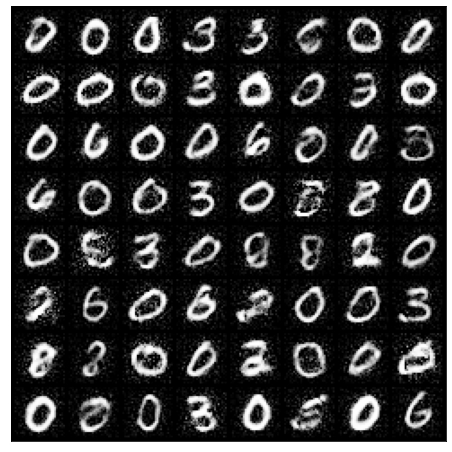

In [ ]:
#310
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


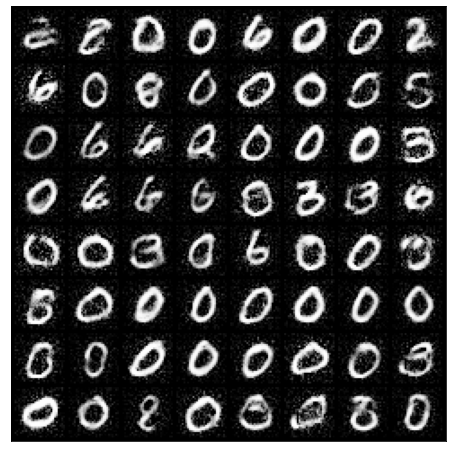

In [ ]:
#335
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


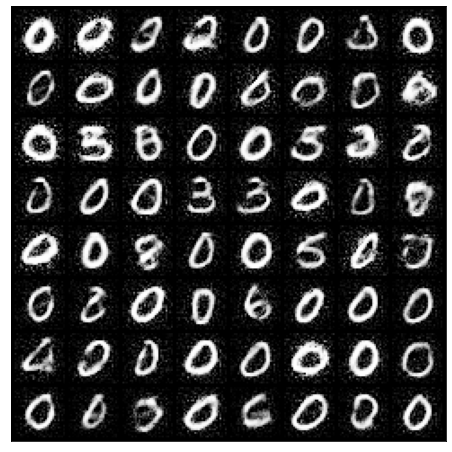

In [ ]:
#345
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


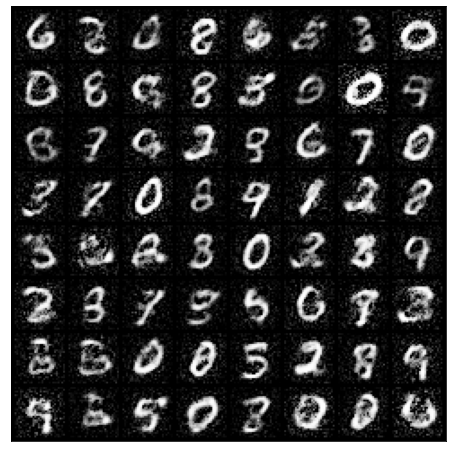

In [ ]:
#145
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


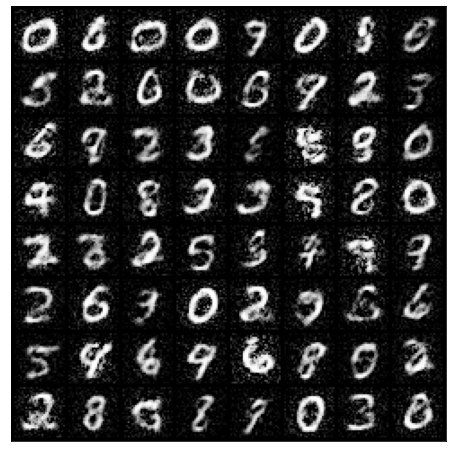

In [ ]:
#95
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

In [ ]:
#95
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


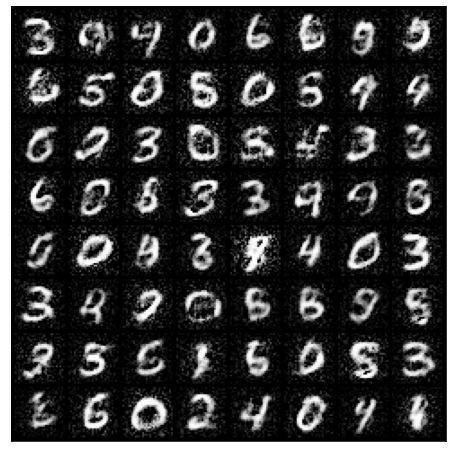

In [ ]:
#95
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


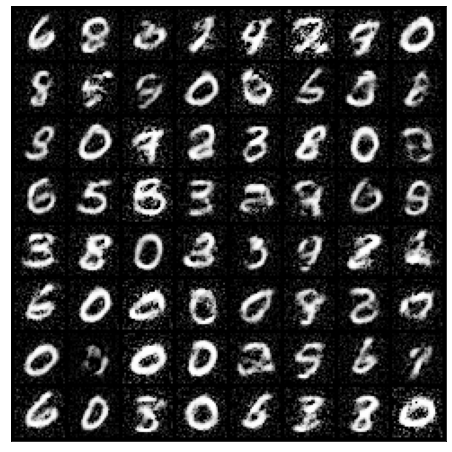

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


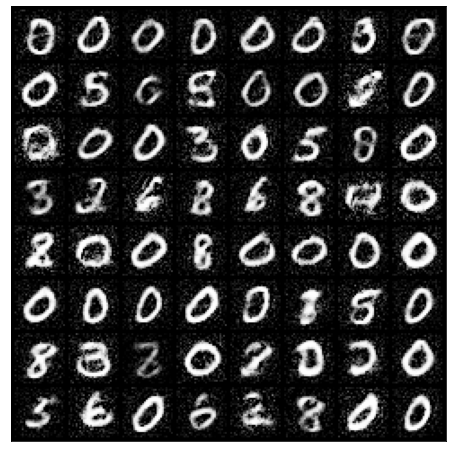

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


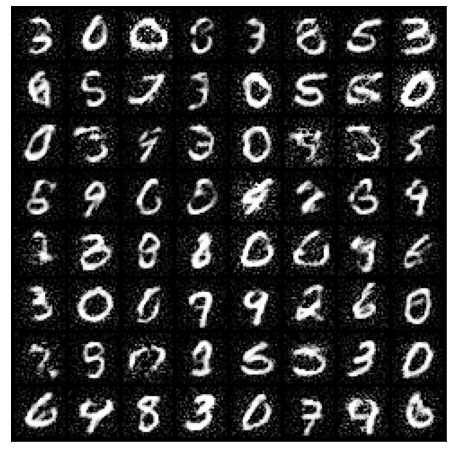

In [ ]:
#300
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


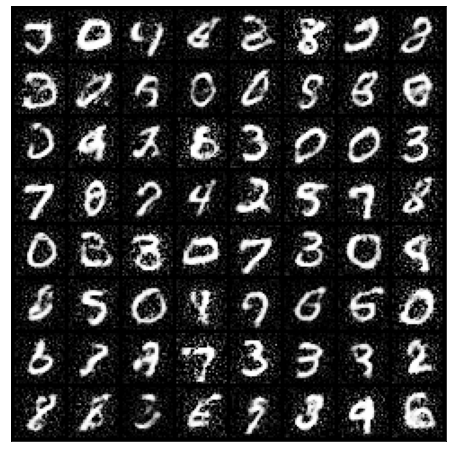

In [ ]:
#300
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


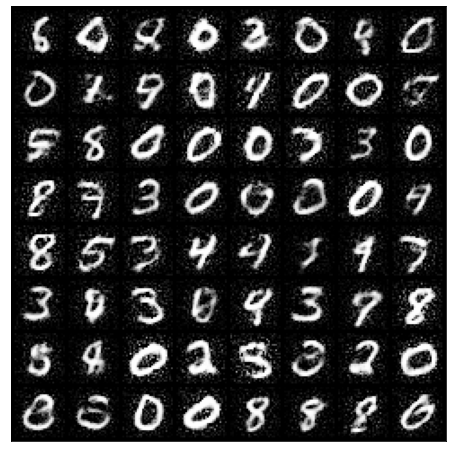

In [ ]:
#300
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


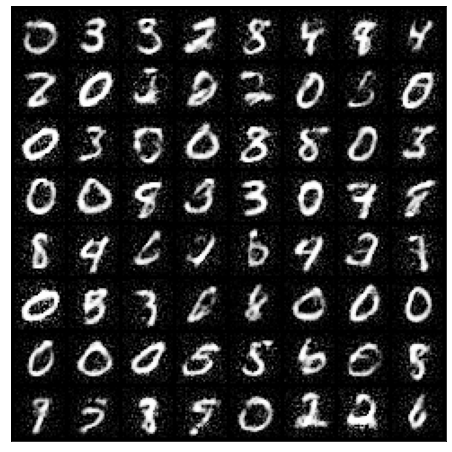

In [ ]:
#300
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


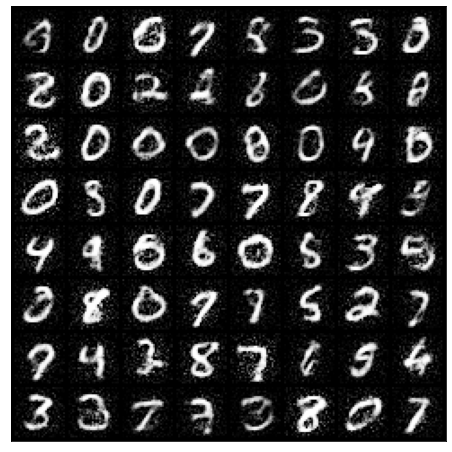

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


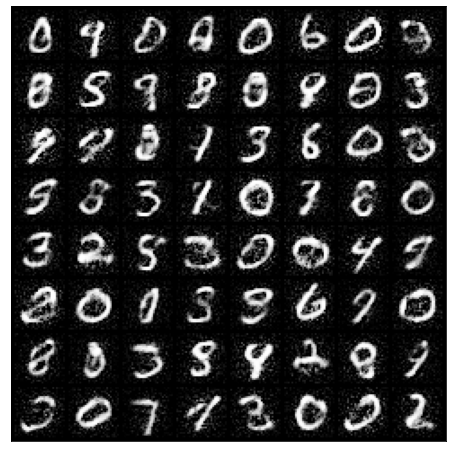

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


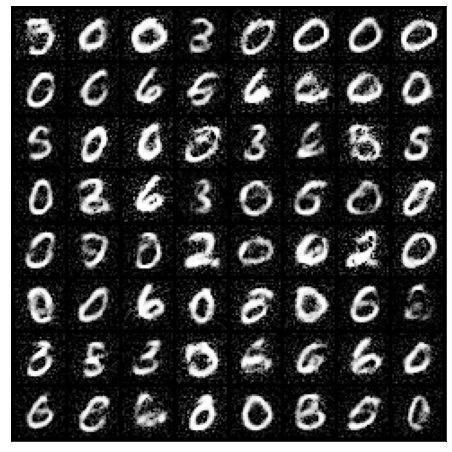

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

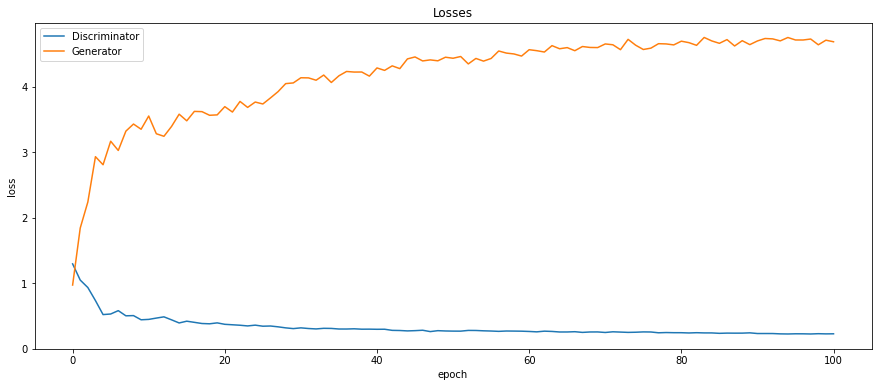

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


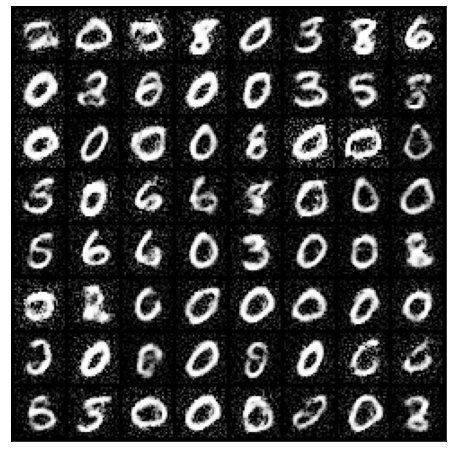

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


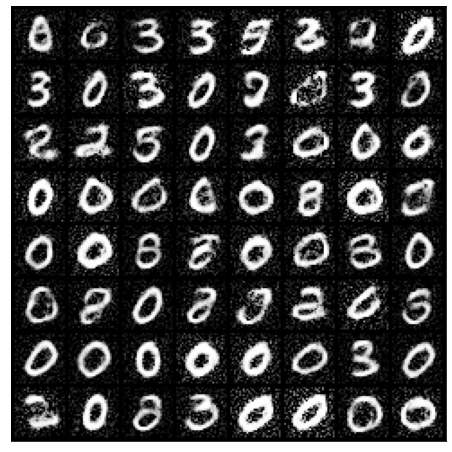

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

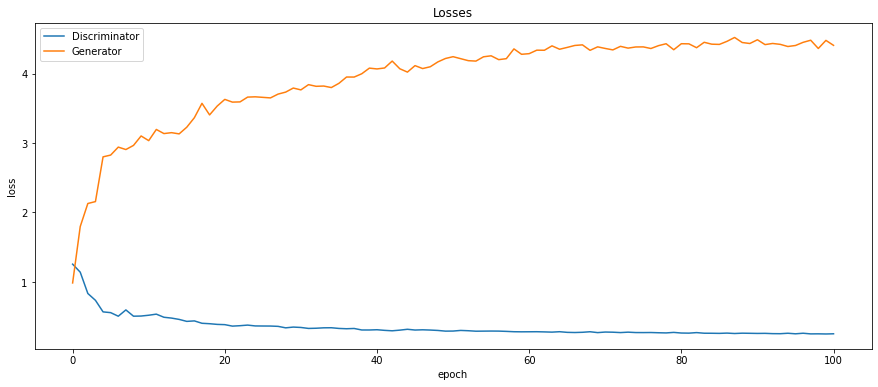

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

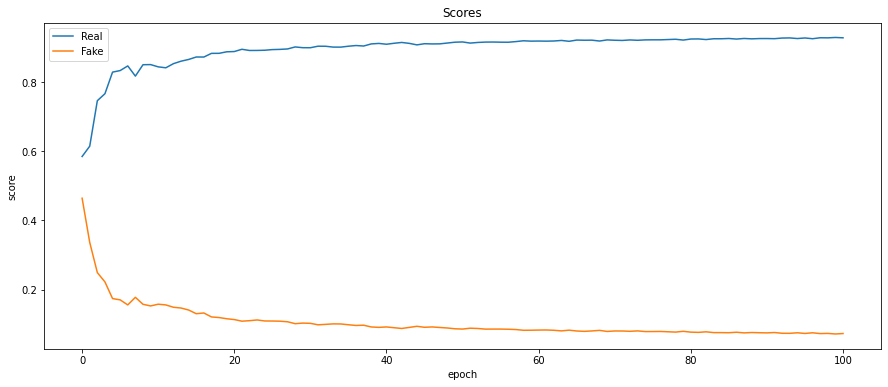

In [ ]:
plt.figure(figsize=(15, 6))

plt.plot(real_score, '-')
plt.plot(fake_score, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
discriminator = torch.load("model_dis130.zip")
generator = torch.load("model_gen130.zip")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


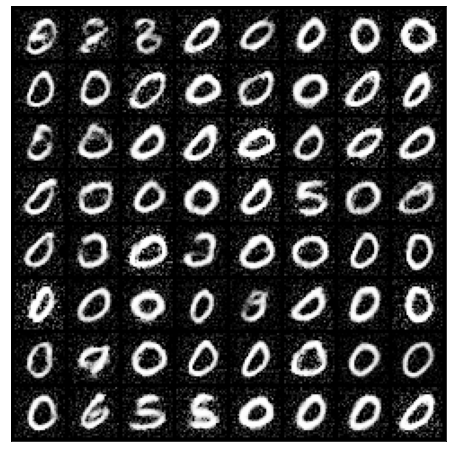

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

In [ ]:
discriminator = torch.load("model_dis110.zip")
generator = torch.load("model_gen110.zip")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


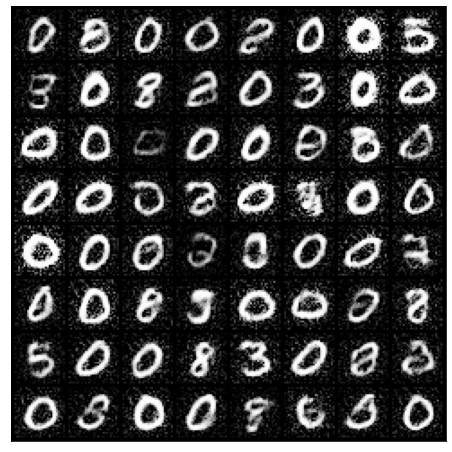

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

In [ ]:
discriminator = torch.load("model_dis170.zip")
generator = torch.load("model_gen170.zip")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


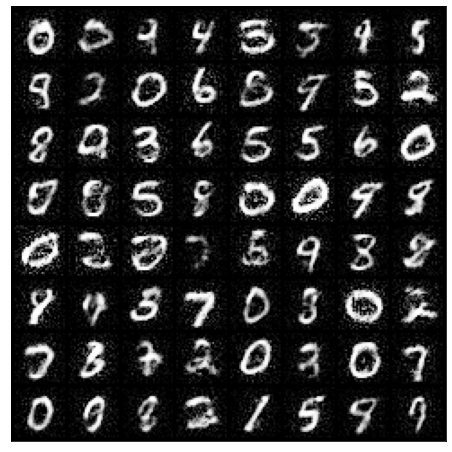

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

In [ ]:
discriminator = torch.load("model_dis95.zip")
generator = torch.load("model_gen95.zip")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


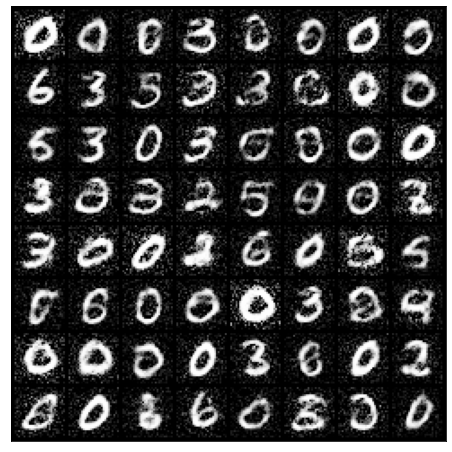

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

In [ ]:
discriminator = torch.load("model_dis90.zip")
generator = torch.load("model_gen90.zip")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


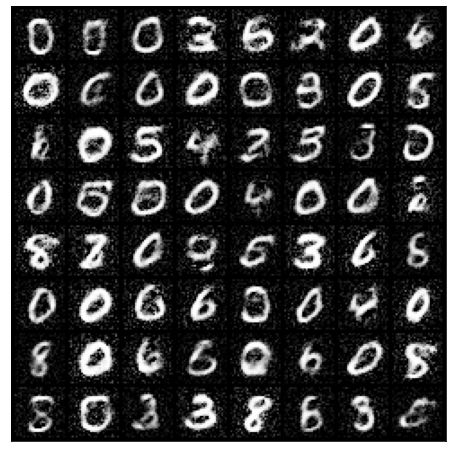

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


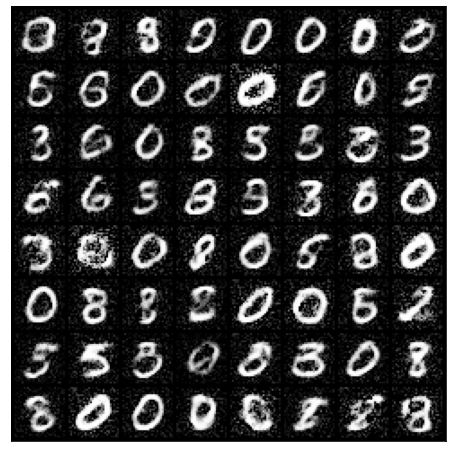

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


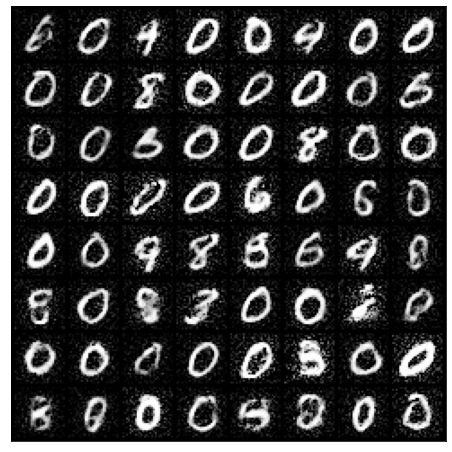

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


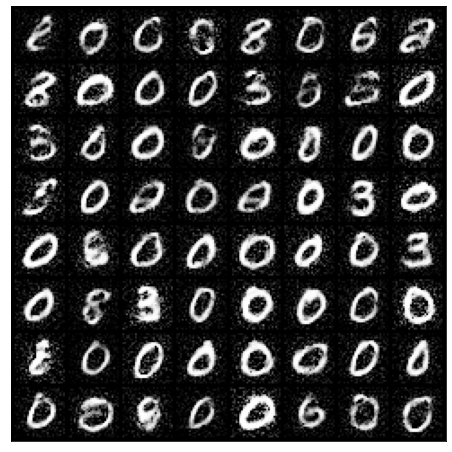

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


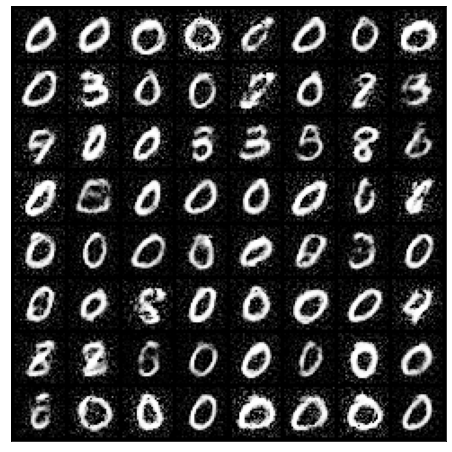

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


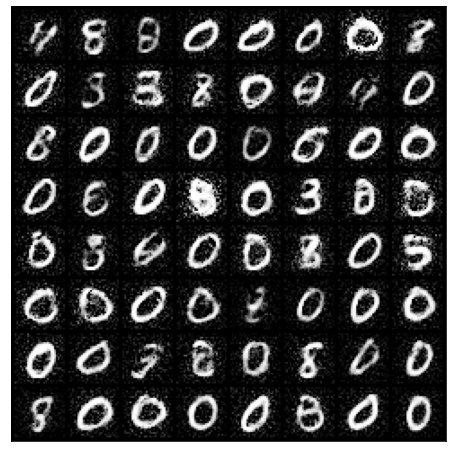

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


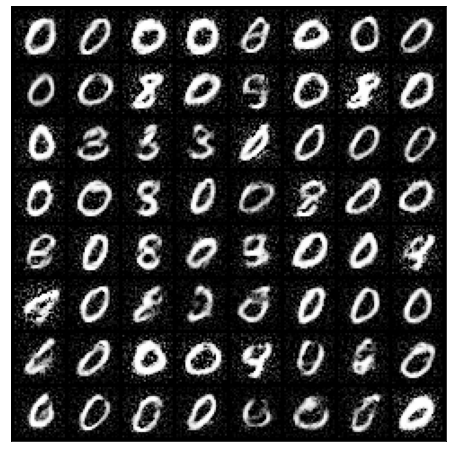

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


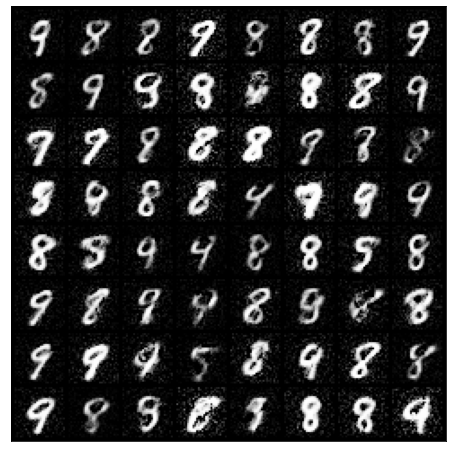

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 1, 28, 28])


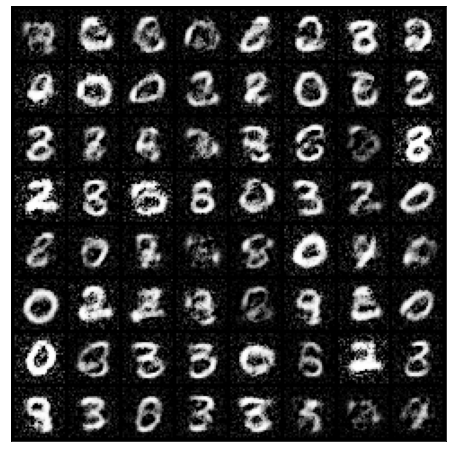

In [ ]:
image = []
for i in range(64):
  latent = torch.randn(batch_size, latent_size, device=device)
  fake_image = generator(latent)
  fake_image = fake_image.view(fake_image.size(0), 1, 28, 28)
  #fake_image = fake_image.cpu().detach().numpy() 
  image.append(fake_image[0].cpu())
#image = torch.FloatTensor(image) 
print(fake_image.shape)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(image, nrow=8).permute(1, 2, 0))

In [ ]:
discriminator = torch.load("model_dis200.zip")
generator = torch.load("model_gen200.zip")